In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2 as cv # opencv

from matplotlib import pyplot as plt

from PIL import Image
import seaborn as sns
from tqdm import tqdm
from glob import glob

import os

from IPython.display import clear_output as cls


In [4]:
!python --version


Python 3.7.12


# Dữ liệu

In [5]:
base_dir = '/kaggle/input/pins-face-recognition/'

In [6]:
# Lấy danh sách tên
dir_names = os.listdir(base_dir + '105_classes_pins_dataset')
person_names = [name.split("_")[-1].title() for name in dir_names]
n_individuals = len(person_names)

print(f"Total number of individuals: {n_individuals}\n")
print(f"Name of the individuals : \n\t{person_names}")

Total number of individuals: 105

Name of the individuals : 
	['Alex Lawther', 'Logan Lerman', 'Maria Pedraza', 'Anthony Mackie', 'Bobby Morley', 'Chris Evans', 'Chris Pratt', 'Mark Zuckerberg', 'Anne Hathaway', 'Emilia Clarke', 'Cristiano Ronaldo', 'Josh Radnor', 'Henry Cavil', 'Zoe Saldana', 'Ellen Page', 'Gwyneth Paltrow', 'Natalie Dormer', 'Barbara Palvin', 'Krysten Ritter', 'Elon Musk', 'Leonardo Dicaprio', 'Bill Gates', 'Elizabeth Olsen', 'Megan Fox', 'Taylor Swift', 'Tom Hiddleston', 'Jeremy Renner', 'Melissa Fumero', 'Robert Downey Jr', 'Amber Heard', 'Jake Mcdorman', 'Robert De Niro', 'Grant Gustin', 'Jennifer Lawrence', 'Eliza Taylor', 'Scarlett Johansson', 'Marie Avgeropoulos', 'Brenton Thwaites', 'Adriana Lima', 'Amanda Crew', 'Hugh Jackman', 'Katherine Langford', 'Camila Mendes', 'Selena Gomez', 'Avril Lavigne', 'Jeff Bezos', 'Jimmy Fallon', 'Christian Bale', 'Shakira Isabel Mebarak', 'Alvaro Morte', 'Lindsey Morgan', 'Zac Efron', 'Dominic Purcell', 'Barack Obama', 'Tom Ho

In [7]:
# Số ảnh của từng người trong danh sách
n_images_per_person = [len(os.listdir(base_dir + '105_classes_pins_dataset/' + name)) for name in dir_names]
n_images = sum(n_images_per_person)

print(f"Total Number of Images : {n_images}.")

Total Number of Images : 17534.


## Trực quan số lượng mẫu

In [8]:
import plotly.express as px

In [9]:
# Sắp xếp hai danh sách dựa trên số lượng ảnh
sorted_indices = np.argsort(n_images_per_person)
sorted_person_names = [person_names[i] for i in sorted_indices]
sorted_n_images_per_person = [n_images_per_person[i] for i in sorted_indices]

In [10]:
fig = px.bar(x=sorted_person_names, y=sorted_n_images_per_person, color=sorted_person_names)
fig.update_layout({'title':{'text':"Số lượng ảnh của mỗi người"}})
fig.show()

## Load ảnh

In [11]:
# Setting a random
np.random.seed(42)

# Define the image dimensions
IMG_W, IMG_H, IMG_C = (160, 160, 3)

In [12]:
# Chọn 50 hình ảnh đầu tiên từ mỗi người và xáo trộn
filepaths = [path for name in dir_names for path in glob(base_dir + '105_classes_pins_dataset/' + name + '/*')[:50]]
np.random.shuffle(filepaths)
print(f"Total number of images to be loaded : {len(filepaths)}")

# Tạo không gian cho hình ảnh và nhãn
all_images = []
all_labels = []

# Tải và tiền xử lý hình ảnh
for i, path in tqdm(enumerate(filepaths), desc="Loading Data"):
    label = person_names.index([name[5:] for name in dir_names if name in path][0].title())
    image = plt.imread(path)
    image = cv.resize(image, (IMG_W, IMG_H)).astype(np.float32) / 255.0 # Chuẩn hoá về 0-1
    all_images.append(image)
    all_labels.append(label)

# Chuyển đổi danh sách thành mảng numpy
all_images = np.array(all_images, dtype=np.float32)
all_labels = np.array(all_labels, dtype=np.int32)

Total number of images to be loaded : 5250


Loading Data: 5250it [00:50, 104.28it/s]


## Trực quan các ảnh

In [13]:
def show_img(imgs, labels, recognize = None, database = None, GRID: tuple=(15,6), FIGSIZE: tuple=(25,50)):

    # Cấu hình figure
    plt.figure(figsize=FIGSIZE)
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols

    for i in range(n_images):

        # Chọn ra 1 tấm bất kì để show
        i_img = np.random.randint(len(imgs))
        image, label = imgs[i_img], person_names[int(labels[i_img])]

        # Create a Subplot
        plt.subplot(n_rows, n_cols, i+1)

        # Plot Image
        plt.imshow(image)
        plt.axis('off')

        if recognize is None:
            # Tên
            plt.title(label)
        else:
            recognized = recognize(image, database)
            plt.title(f"True:{label}\nPred:{recognized}")

    # Hiển thị plot đã tạo
    plt.tight_layout()
    plt.show()

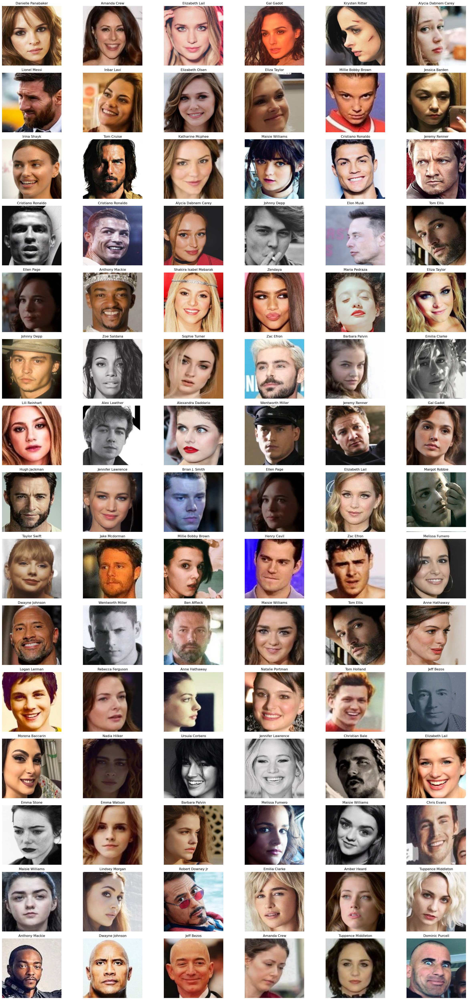

In [14]:
show_img(imgs = all_images, labels = all_labels)

# Xây dựng các hàm cần thiết cho mô hình nhận dạng

In [15]:
from tensorflow.keras.models import load_model

## load 1 ảnh

In [16]:
def load_image(image_path: str, IMG_W: int = IMG_W, IMG_H: int = IMG_H) -> np.ndarray:

    image = plt.imread(image_path)
    # Resize
    image = cv.resize(image, dsize=(IMG_W, IMG_H))

    # Chuẩn hoá về 0-1
    image = image.astype(np.float32) / 255.0

    return image

## Embedding

In [17]:
def img2embedding(image, model):
    # Trích xuất đặc trưng
    # Thêm 1 chiều vào mảng (số lượng hình ảnh, chiều cao, chiều rộng, số kênh màu)
    embedding = model.predict(image[np.newaxis,...])

    # Chuẩn hoá L2 (đưa độ dài về bằng 1)
    embedding /= np.linalg.norm(embedding, ord=2)

    return embedding

## Tính embedding trung bình

In [18]:
def generate_avg_embedding(image_paths: list, model):
    
    # Tạo mảng để lưu trữ các embedding
    embeddings = np.empty(shape=(len(image_paths), 128))
    
    # Clear output
    cls()
    
    # Duyệt qua các hình ảnh
    for index, image_path in enumerate(image_paths):

        # Tải hình ảnh
        image = load_image(image_path)

        # Tạo embedding từ hình ảnh
        embedding = img2embedding(image, model)

        # Lưu trữ embedding
        embeddings[index] = embedding

    # Tính toán embedding trung bình
    avg_embedding = np.mean(embeddings, axis=0)

    # Trả về embedding trung bình
    return avg_embedding


In [19]:
# Model
from tensorflow.keras.models import load_model
# Load model
model = load_model('/kaggle/input/facenet-keras/facenet_keras.h5')

In [20]:
# Lấy 50 path của ảnh cho mỗi người
filepaths = [np.random.choice(glob(base_dir + '105_classes_pins_dataset/' + name + '/*'), size=10) for name in dir_names]

# Khởi tạo database
database = {name:generate_avg_embedding(paths, model=model) for paths, name in tqdm(zip(filepaths, person_names), desc="Generating Embeddings")}

1/1 [==============================] - 0s 77ms/step


Generating Embeddings: 105it [02:39,  1.52s/it]


In [21]:
def compare_embeddings(embedding_1: np.ndarray, embedding_2: np.ndarray, threshold: float = 0.8) -> int:
    # Lấy vector hiệu
    embedding_distance = embedding_1 - embedding_2

    # Tính khoảng cách euclid
    embedding_distance_norm = np.linalg.norm(embedding_distance)

    # trả về
    return embedding_distance_norm if embedding_distance_norm < threshold else 0

In [22]:
def recognize_face(image: np.ndarray, database: dict, threshold: float = 1.0, model = model):

    # Tính embedding cho ảnh mới
    image_emb = img2embedding(image, model)

    # Clear output
    cls()
    
    distances = []
    names = []

    # lặp qua database
    for name, embed in database.items():

        # So sánh euclid của 2 feature
        dist = compare_embeddings(embed, image_emb, threshold=threshold)

        if dist > 0:
            # Lưu lại khoảng cách 
            distances.append(dist)
            names.append(name)

    # Lấy khoảng cách nhỏ nhất
    if distances:
        min_dist = min(distances)

        return names[distances.index(min_dist)].title().strip()

    return "No Match Found"

# Đánh giá mô hình

## Chọn ngẫu nhiên 1 mẫu

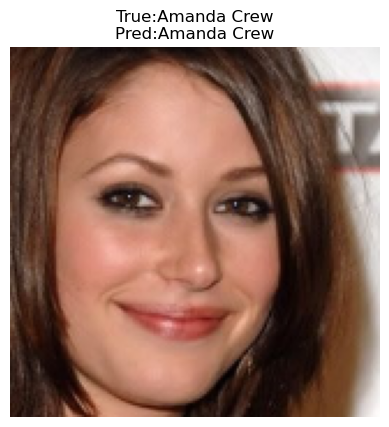

In [23]:
# Chọn ngẫu nhiên một index
index = np.random.randint(len(all_images))

# lấy ảnh và nhãn được chọn
image_ = all_images[index]
label_ = person_names[int(all_labels[index])]

# predict ảnh
title = recognize_face(image_, database)

# Hiển thị kết quả
plt.imshow(image_)
plt.title(f"True:{label_}\nPred:{title}")
plt.axis('off')
plt.show()


## Chọn ngẫu nhiên n mẫu

In [24]:
import time

In [25]:
# Số lượng mẫu muốn pred
n_images = 100

# Đếm số mãu pred đúng
n_correct = 0

# Chọn ngẫu nhiên n_images mẫu
indicies = np.random.permutation(n_images)
temp_images = all_images[indicies]
temp_labels = all_labels[indicies]

start_time = time.time() # Lấy thời gian bắt đầu
# Lặp qua các mẫu và pred
for (image, label) in zip(temp_images, temp_labels):
    
    # Lấy nhãn đúng
    true_label = person_names[int(label)]

    # Pred nhãn
    pred_label = recognize_face(image, database)

    # nếu đúng thì +1
    if true_label == pred_label:
        n_correct += 1
        
end_time = time.time() # Lấy thời gian kết thúc
# Tính độ chính xác
acc = (n_correct / n_images) * 100.0
elapsed_time = end_time - start_time # Tính thời gian chạy

print(f"Model Accuracy: {acc}%!!!")
print('Time for predict', elapsed_time) # In ra thời gian chạy

Model Accuracy: 89.0%!!!
Time for predict 14.699918508529663


Mô hình đạt độ chính xác là xấp sỉ 90%:

    - Cho thấy mô hình có khả năng dự đoán chính xác kết quả trong hầu hết các trường hợp.
    - Thời gian predict cho các mẫu là rất nhanh. Khoảng 20s cho 100 mẫu